In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
from nba_api.stats.endpoints import leaguegamelog
from nba_api.stats.endpoints import teamgamelog
from nba_api.stats.endpoints import boxscoretraditionalv2
from nba_api.stats.static import teams
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score
from sklearn.multioutput import MultiOutputRegressor
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import shap
from tqdm import tqdm

# Predizzione basata sullo stato di forma della squadra
### Metodo per calcolare la forza di una squadra

In [2]:
def ft_FPW_player(player, boxscore_data_cleaned):
    # Calcola i fantasy points utilizzando le statistiche disponibili e i coefficienti appropriati
    coeff_pts = 1.0
    coeff_reb = 1.2
    coeff_ast = 1.5
    coeff_stl = 3.0
    coeff_blk = 3.0
    coeff_to = -1.0
    
    player_stats=boxscore_data_cleaned[boxscore_data_cleaned["PLAYER_ID"] == player]

    fantasy_points = (player_stats['PTS'] * coeff_pts +
                    player_stats['REB'] * coeff_reb +
                    player_stats['AST'] * coeff_ast +
                    player_stats['STL'] * coeff_stl +
                    player_stats['BLK'] * coeff_blk +
                    player_stats['TO'] * coeff_to)
    # print(player)
    # print(fantasy_points)
    # print(player_stats['MIN'].to_list()[0])
    
    minutes = float(f"{player_stats['MIN'].to_list()[0].split('.')[0]}.{player_stats['MIN'].to_list()[0].split(':')[-1]}")
    #print(fantasy_points*minutes)
    ##pesato in base ai minuti giocati
    #print(f"minutes: {minutes}, fp: {float(fantasy_points)}")
    fantasy_points_w = float(fantasy_points) * minutes
    #print("fw: ", fantasy_points_w)
    ## ritorno solo il FP dell'ultima season
    return fantasy_points_w

# Ottengo FP del team pesato
def get_FP_team_weigthed(team_players_id, boxscore_data_cleaned):
    fp_team = 0

    for player in team_players_id:
        fp_team += ft_FPW_player(player, boxscore_data_cleaned)
    return fp_team

In [4]:
# MOMENTANEAMENTE INUTILE
def normalize_stats_with_weights(team_stats, weights):
    max_stats = np.max(team_stats)  # Calcola il massimo valore per ogni statistica
    weighted_stats = team_stats * weights  # Applica pesi alle statistiche
    normalized_stats = (weighted_stats / max_stats) * 100  # Normalizza le statistiche in base al massimo valore e scala da 0 a 100
    return normalized_stats

def recent_team_strength_with_weights(team_stats, weights):
    avg_stats = np.mean(team_stats, axis=0)  # Calcola le medie delle statistiche recenti
    mms = MinMaxScaler()
    avg_stats = mms.fit_transform(pd.DataFrame(avg_stats)) * weights
    #normalized_avg_stats = normalize_stats_with_weights(avg_stats, weights)  # Normalizza le statistiche con pesi
    team_strength = np.mean(avg_stats)  # Calcola la media delle statistiche normalizzate come indice di forza relativa
    return team_strength

# Calcola la forza della squadra a partire dall'abbreviazione e enenendo conto solo delle ultime n_partite partite
def get_strength_by_abv(abv, weight, n_partite):
    # Ottieni i dati delle partite passate della squadra specificata
    game_log = teamgamelog.TeamGameLog(teams.find_team_by_abbreviation(abv)['id'])

    # Ottieni i dati dei DataFrame e tengo solo le ultime k partite
    game_log_data = game_log.get_data_frames()[0][:n_partite]

    #game_log_data = game_log_data[['PTS', 'FG_PCT', 'FT_PCT', 'OREB','DREB','AST','FG3_PCT','STL','BLK','W_PCT']]

    #CALCOLO FP PER OGNI PARTITA
    fp = []
    for index, row in tqdm(game_log_data.iterrows()):
        boxscore = boxscoretraditionalv2.BoxScoreTraditionalV2(row["Game_ID"])
 
        # Ottieni i dati dei DataFrame
        boxscore_data_cleaned = boxscore.get_data_frames()[0].dropna()

        team_players_id = boxscore_data_cleaned[boxscore_data_cleaned["TEAM_ABBREVIATION"] == row['MATCHUP'].split(" ")[0]]["PLAYER_ID"].to_list()
        fp.append(get_FP_team_weigthed(team_players_id, boxscore_data_cleaned))
    game_log_data['FP'] = fp

    # Peso il risultato anche in base alla percentuale di vittorie in questa stagione
    return recent_team_strength_with_weights(game_log_data[['PTS','FG_PCT', 'FT_PCT', 'OREB','DREB','AST','FG3_PCT','STL','BLK', 'FP']], weight) * game_log_data['W_PCT'][0]

# Test
cle_strength = get_strength_by_abv('bos',[1,1,1,1,1,1,1,1,1],20)
print("Forza relativa della squadra nelle ultime {} partite: {:.2f}".format(20, cle_strength))

20it [00:39,  1.96s/it]

Forza relativa della squadra nelle ultime 20 partite: 0.08


### VERSIONE CORRETTA

In [5]:
# Ottengo un dataset con una riga per ogni partita di una squadra con tutte le statistiche di tale squadra
# - si ignora "in casa" e "fuori casa"
def season_games2():
    final_df = pd.DataFrame()
    for i in range(3,4):
        season = f"202{i}-2{i+1}"

        # Ottieni i dettagli delle partite giocate nella stagione specificata
        game_log = leaguegamelog.LeagueGameLog(season=season)
        
        # Ottieni i dati dei DataFrame
        game_log_data = game_log.get_data_frames()[0]
        
        final_df = pd.concat([final_df, game_log_data], axis = 0)

    final_df.index = range(0, len(final_df))

    # final_df = final_df[:10]

    #CALCOLO FP PER OGNI PARTITA (OLTRE 2000)
    fp = []
    for index, row in tqdm(final_df.iterrows()):
        boxscore = boxscoretraditionalv2.BoxScoreTraditionalV2(row["GAME_ID"])
 
        # Ottieni i dati dei DataFrame
        boxscore_data_cleaned = boxscore.get_data_frames()[0].dropna()

        team_players_id = boxscore_data_cleaned[boxscore_data_cleaned["TEAM_ABBREVIATION"] == row['MATCHUP'].split(" ")[0]]["PLAYER_ID"].to_list()
        fp.append(get_FP_team_weigthed(team_players_id, boxscore_data_cleaned))
    final_df['FP'] = fp

    return final_df
final_df = season_games2()[['TEAM_ABBREVIATION','WL','PTS', 'FG_PCT', 'FT_PCT', 'OREB','DREB','AST','FG3_PCT','STL','BLK', 'FP']]
final_df

2460it [41:23,  1.01s/it]


,TEAM_ABBREVIATION,WL,PTS,FG_PCT,FT_PCT,OREB,DREB,AST,FG3_PCT,STL,BLK,FP
0,LAL,L,107,0.456,0.750,13,31,23,0.345,5,4,5995.781
1,DEN,W,119,0.527,0.750,9,33,29,0.412,9,6,7866.046
2,PHX,W,108,0.442,0.765,17,43,23,0.333,5,7,6597.447
3,GSW,L,104,0.356,0.786,18,31,19,0.233,11,6,6177.712
4,DAL,W,126,0.475,0.739,13,35,24,0.319,6,3,7311.780
...,...,...,...,...,...,...,...,...,...,...,...,...
2455,PHI,W,107,0.427,0.733,13,44,30,0.318,8,6,6104.499
2456,BKN,L,86,0.386,0.765,4,38,19,0.265,8,6,5885.604
2457,CLE,L,110,0.473,0.667,12,31,30,0.485,4,1,4728.910
2458,CHA,W,120,0.505,0.818,10,37,36,0.475,10,9,8250.757


### VERSIONE CORRETTA

In [6]:
def get_regressor2(df):
    mms = MinMaxScaler()
    df = df.dropna()
    X = df[['PTS','FG_PCT', 'FT_PCT', 'OREB','DREB','AST','FG3_PCT','STL','BLK', "FP"]] # Seleziona le caratteristiche rilevanti
    y = df['WL']  # Etichetta di output
    
    X = pd.DataFrame(mms.fit_transform(X), columns = X.columns)

    # Dividi i dati in set di addestramento e set di test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Inizializza il modello di regressione logistica
    model = LogisticRegression()

    # Addestra il modello
    model.fit(X_train, y_train)

    explainer = shap.Explainer(model, X)
    shap_values = explainer(X)

    weight = []
    weight_tab = pd.DataFrame(shap_values.values, columns = X.columns)
    for col in weight_tab.columns:
        weight.append(np.mean(np.abs(weight_tab[col])))

    predictions = model.predict(X_test)
    print("Accuracy = {:.2}".format(accuracy_score(y_test, predictions)))

    return model, weight, weight_tab

m, weight, weight_tab = get_regressor2(final_df)

Accuracy = 0.84


In [7]:
# Controllo i pesi
np.abs(weight_tab).mean(axis = 0)

PTS        0.269253
FG_PCT     0.720935
FT_PCT     0.199010
OREB       0.149532
DREB       0.817177
AST        0.024836
FG3_PCT    0.306179
STL        0.385739
BLK        0.185651
FP         0.116935
dtype: float64

In [10]:
# Test
# ---- MAIN ----
#final_df = season_games2()[['TEAM_ABBREVIATION','WL','PTS', 'FG_PCT', 'FT_PCT', 'OREB','DREB','AST','FG3_PCT','STL','BLK','FP']]
m, weight, weight_tab = get_regressor2(final_df)

Accuracy = 0.84


In [11]:
# weight = [0.35353210943121816,
#  0.6773026060484189,
#  0.1632154672151238,
#  0.1774744792594547,
#  0.7970150952121257,
#  0.028062570626348697,
#  0.3352530622990414,
#  0.36268890394761993,
#  0.1920613673696502]
weight

[0.2692530991195059,
 0.7209350734890745,
 0.19900967220334495,
 0.14953188233000456,
 0.8171771310389748,
 0.024835965923722118,
 0.30617936688553166,
 0.38573865209770575,
 0.18565061674123018,
 0.11693481303621481]

In [13]:
# bos_strength = get_strength_by_abv('bos',weight,50) # Calcolerà 50 FP
# det_strength = get_strength_by_abv('chi',weight,50) # Calcolerà 50 FP
# print("Forza relativa della squadra nelle ultime {} partite: {:.5f}".format(50, bos_strength))
# print("Forza relativa della squadra nelle ultime {} partite: {:.5f}".format(50, det_strength))

# TEST

**Stagione Corrente**

In [15]:
for i in range(3,4):
    season = f"202{i}-2{i+1}"
    
    # Ottieni i dettagli delle partite giocate nella stagione specificata
    game_log = leaguegamelog.LeagueGameLog(season=season)
    
    # Ottieni i dati dei DataFrame
    game_log_data = game_log.get_data_frames()[0]

In [16]:
abv = game_log_data["TEAM_ABBREVIATION"].unique()

strengths = {}
for abbr in tqdm(abv):
    strengths[abbr] = get_strength_by_abv(abbr, weight, 50)

predictions = []
for i in range(3,4):
    season = f"202{i}-2{i+1}"
    
    # Ottieni i dettagli delle partite giocate nella stagione specificata
    game_log = leaguegamelog.LeagueGameLog(season=season)
    
    # Ottieni i dati dei DataFrame
    game_log_data = game_log.get_data_frames()[0]
    
    for index, row in tqdm(game_log_data.iterrows()):
        home_strength = strengths[row["TEAM_ABBREVIATION"]]
        away_strength = strengths[row["MATCHUP"].split(" ")[-1]]
        if home_strength >= away_strength:
            predictions.append("W")
        else:
            predictions.append("L")

predictions

50it [00:26,  1.86it/s]00:00<?, ?it/s]
50it [00:26,  1.90it/s]00:27<13:07, 27.16s/it]
50it [00:27,  1.80it/s]00:53<12:31, 26.84s/it]
50it [00:26,  1.89it/s]01:21<12:18, 27.35s/it]
50it [00:24,  2.02it/s]01:48<11:44, 27.11s/it]
50it [00:21,  2.37it/s]02:13<10:58, 26.35s/it]
50it [00:27,  1.84it/s]02:34<09:51, 24.63s/it]
50it [00:30,  1.62it/s]03:02<09:47, 25.53s/it]
50it [00:28,  1.76it/s]03:34<10:07, 27.62s/it]
50it [00:34,  1.45it/s]04:02<09:46, 27.94s/it]
50it [00:28,  1.74it/s][04:37<10:01, 30.06s/it]
50it [00:25,  1.94it/s][05:07<09:30, 30.02s/it]
50it [00:24,  2.03it/s][05:33<08:37, 28.78s/it]
50it [00:23,  2.12it/s][05:59<07:54, 27.91s/it]
50it [00:31,  1.60it/s][06:23<07:06, 26.67s/it]
50it [00:25,  1.99it/s][06:54<07:02, 28.14s/it]
50it [00:30,  1.62it/s][07:20<06:22, 27.30s/it]
50it [00:33,  1.47it/s][07:52<06:13, 28.71s/it]
50it [00:21,  2.32it/s][08:26<06:04, 30.35s/it]
50it [00:22,  2.23it/s][08:49<05:08, 28.09s/it]
50it [00:25,  1.94it/s][09:12<04:27, 26.77s/it]
50it [00:2

['L',
 'W',
 'W',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L'

In [17]:
# predictions = []
# for index, row in tqdm(game_log_data.iterrows()):
#     #print(f"{row['TEAM_ABBREVIATION']} vs {row['MATCHUP'].split(' ')[-1]}")
#     home_strength = get_strength_by_abv(row["TEAM_ABBREVIATION"],weight,50) # Calcolerà 50 FP
#     away_strength = get_strength_by_abv(row["MATCHUP"].split(" ")[-1],weight,50) # Calcolerà 50 FP
#     if home_strength >= away_strength:
#         predictions.append("W")
#     else:
#         predictions.append("L")
    
# predictions

In [18]:
y_true = game_log_data["WL"].to_list()
y_pred = predictions

In [19]:
# count = 0

# for i in range(0, len(y_true), 2):
#     if y_true[i] == y_true[i+1]:
#         print(game_log_data.iloc[i]["GAME_ID"], game_log_data.iloc[i+1]["GAME_ID"])
#         count += 1
# print(count)

In [20]:
# #controllo a coppie
# count = 0

# for i in range(0, len(y_pred), 2):
#     if y_pred[i] == y_pred[i+1]:
#         print("sbagliato")
#         count += 1
# print(count)

In [21]:
from sklearn.metrics import accuracy_score
print(f"Accuracy: {accuracy_score(y_true, y_pred)*100}")

Accuracy: 67.15447154471545


In [22]:
from nba_api.stats.endpoints import leaguestandings

# Ottieni la classifica della NBA
standings = leaguestandings.LeagueStandings()

# Ottieni i dati sotto forma di DataFrame
standings_df = standings.get_data_frames()[0]

# Stampare la classifica
standings_df


,LeagueID,SeasonID,TeamID,TeamCity,TeamName,Conference,ConferenceRecord,PlayoffRank,ClinchIndicator,Division,...,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,PreAS,PostAS
0,00,22023,1610612738,Boston,Celtics,East,41-11,1,- e,Atlantic,...,None,None,None,None,None,3-0,11-4,12-2,43-12,21-6
1,00,22023,1610612760,Oklahoma City,Thunder,West,36-16,1,- w,Northwest,...,None,None,None,None,None,3-1,9-5,10-3,37-17,20-8
2,00,22023,1610612743,Denver,Nuggets,West,33-19,2,- x,Northwest,...,None,None,None,None,None,4-0,9-6,10-5,36-19,21-6
3,00,22023,1610612752,New York,Knicks,East,35-17,2,- x,Atlantic,...,None,None,None,None,None,2-2,9-5,6-8,33-22,17-10
4,00,22023,1610612749,Milwaukee,Bucks,East,34-18,3,- c,Central,...,None,None,None,None,None,2-1,11-5,11-2,35-21,14-12
5,00,22023,1610612750,Minnesota,Timberwolves,West,37-15,3,- x,Northwest,...,None,None,None,None,None,1-2,13-2,10-3,39-16,17-10
6,00,22023,1610612739,Cleveland,Cavaliers,East,31-21,4,- x,Central,...,None,None,None,None,None,1-3,9-6,8-5,36-17,12-17
7,00,22023,1610612746,LA,Clippers,West,30-22,4,- p,Pacific,...,None,None,None,None,None,3-1,5-9,11-2,36-17,15-14
8,00,22023,1610612742,Dallas,Mavericks,West,31-21,5,- sw,Southwest,...,None,None,None,None,None,3-0,8-6,8-8,32-23,18-9
9,00,22023,1610612753,Orlando,Magic,East,32-20,5,- se,Southeast,...,None,None,None,None,None,2-2,11-3,6-8,30-25,17-10


In [ ]:
from nba_api.stats.static import teams

# Ottieni tutte le squadre NBA
nba_teams = teams.get_teams()

In [47]:

predictions = []

for index, row in tqdm(game_log_data.iterrows()):
    home_strength = strengths[row["TEAM_ABBREVIATION"]]* ((standings_df[standings_df["TeamID"] == row["TEAM_ID"]].index[0]+1)*1/100)
    
        # Definisci l'abbreviazione della squadra di interesse
    team_abbreviation = row["MATCHUP"].split(" ")[-1]  # Esempio: abbreviazione dei Los Angeles Lakers

    # Trova l'ID della squadra corrispondente all'abbreviazione
    team_id = [team['id'] for team in nba_teams if team['abbreviation'] == team_abbreviation][0]

    away_strength = strengths[team_abbreviation] * ((standings_df[standings_df["TeamID"] == team_id].index[0]+1)*1/100)
    
    if home_strength >= away_strength:
        predictions.append("W")
    else:
        predictions.append("L")

2460it [00:01, 1314.05it/s]


In [48]:
# y_true = game_log_data["WL"].to_list()
y_pred = predictions

from sklearn.metrics import accuracy_score
print(f"Accuracy: {accuracy_score(y_true, y_pred)*100}")

Accuracy: 45.77235772357724


**Metodo 1**

In [71]:
for i in range(3,4):
    season = f"202{i}-2{i+1}"
    
    # Ottieni i dettagli delle partite giocate nella stagione specificata
    game_log = leaguegamelog.LeagueGameLog(season=season)
    
    # Ottieni i dati dei DataFrame
    game_log_data = game_log.get_data_frames()[0]

In [76]:

predictions = []
count = 0
for index, row in tqdm(game_log_data.iterrows()):
    
    # Estraggo id delle squadre
    team_id1 = teams.find_team_by_abbreviation(row["TEAM_ABBREVIATION"])['id'] 
    team_id2 = teams.find_team_by_abbreviation(row["MATCHUP"].split(" ")[-1])['id'] 
    
    m = get_regressor_from_stats(match_A_B(team_id1, team_id2))
    
    # Prevedo statistiche di squadra A
    stats1 = predict_stats(team_id1)
    
    predictions.append(m.predict(stats1))
    
    # Prevedo statistiche di squadra B
    stats2 = predict_stats(team_id2)
    # Prevedo WL di squadra B
    
    if m.predict(stats1) == m.predict(stats2):
        count += 1    

0it [00:00, ?it/s]

2288it [1:23:34,  2.19s/it]


In [80]:
predictions_list = [el.tolist()[0] for el in predictions]

In [82]:
print(f"Accuracy: {accuracy_score(y_true, predictions_list)*100}")

Accuracy: 52.01048951048951


# Metodo senza FP

In [84]:
predictions = []
for index, row in tqdm(game_log_data.iterrows()):
    #print(f"{row['TEAM_ABBREVIATION']} vs {row['MATCHUP'].split(' ')[-1]}")
    home_strength = get_strength_by_abv(row["TEAM_ABBREVIATION"],weight,50) # Calcolerà 50 FP
    away_strength = get_strength_by_abv(row["MATCHUP"].split(" ")[-1],weight,50) # Calcolerà 50 FP
    if home_strength >= away_strength:
        predictions.append("W")
    else:
        predictions.append("L")
    
predictions

2182it [34:22,  1.06it/s]


ReadTimeout: HTTPSConnectionPool(host='stats.nba.com', port=443): Read timed out. (read timeout=30)

In [85]:
senza_fp = predictions

In [88]:
print(f"Accuracy: {accuracy_score(y_true[:2182], senza_fp)*100}")

Accuracy: 52.97891842346472


In [86]:
accuracy_score()

2182

**Stagioni 2022-2023 e 2023-2024**

In [195]:
abv = game_log_data["TEAM_ABBREVIATION"].unique()

In [197]:
strengths = {}
for abbr in tqdm(abv):
    strengths[abbr] = get_strength_by_abv(abbr, weight, 50)
    


In [208]:
predictions = []
for i in range(3,4):
    season = f"202{i}-2{i+1}"
    
    # Ottieni i dettagli delle partite giocate nella stagione specificata
    game_log = leaguegamelog.LeagueGameLog(season=season)
    
    # Ottieni i dati dei DataFrame
    game_log_data = game_log.get_data_frames()[0]
    
    for index, row in tqdm(game_log_data.iterrows()):
        home_strength = strengths[row["TEAM_ABBREVIATION"]]
        away_strength = strengths[row["MATCHUP"].split(" ")[-1]]
        if home_strength >= away_strength:
            predictions.append("W")
        else:
            predictions.append("L")

predictions

2400it [00:00, 13692.69it/s]


['W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'L',
 'W',
 'W',
 'L',
 'L',
 'W',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'W',
 'L',
 'L'

In [209]:
len(predictions)

2400

In [210]:
y_pred = predictions

In [211]:
y_true = game_log_data["WL"].to_list()

In [217]:
print(f"Accuracy: {accuracy_score(y_true, y_pred)*100}")

Accuracy: 67.33333333333333


In [158]:
for index, row in game_log_data.iterrows():
    if len(row["MATCHUP"].split(" ")[-1]) != 3:
        print(f"--{row['MATCHUP'].split(' ')[-1]}--")

In [241]:
from nba_api.stats.endpoints import leaguegamelog
 
game_logs = leaguegamelog.LeagueGameLog(season = '2023-24')
games_results = game_logs.get_data_frames()[0]
games_results[(games_results['GAME_ID'] == '0022300066') & (games_results['TEAM_ABBREVIATION'] == 'ORL')]['PTS'].iloc[0]

116

# Migliorare metodo

**Incorrect and correct dataframe**

In [213]:
correct_df = pd.DataFrame(columns=game_log_data.columns)
incorrect_df = pd.DataFrame(columns=game_log_data.columns)


In [214]:
count_correct = 0
count_incorrect = 0

for index, row in game_log_data.iterrows():
    if y_true[index] == y_pred[index]:
        correct_df.loc[len(correct_df)] = row
        count_correct += 1
    else:
        incorrect_df.loc[len(incorrect_df)] = row
        count_incorrect += 1

In [215]:
correct_df

,SEASON_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,WL,MIN,FGM,...,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,VIDEO_AVAILABLE
0,22023,1610612743,DEN,Denver Nuggets,0022300061,2023-10-24,DEN vs. LAL,W,240,48,...,33,42,29,9,6,12,15,119,12,1
1,22023,1610612756,PHX,Phoenix Suns,0022300062,2023-10-24,PHX @ GSW,W,240,42,...,43,60,23,5,7,19,22,108,4,1
2,22023,1610612744,GSW,Golden State Warriors,0022300062,2023-10-24,GSW vs. PHX,L,240,36,...,31,49,19,11,6,11,23,104,-4,1
3,22023,1610612747,LAL,Los Angeles Lakers,0022300061,2023-10-24,LAL @ DEN,L,240,41,...,31,44,23,5,4,12,18,107,-12,1
4,22023,1610612746,LAC,LA Clippers,0022300074,2023-10-25,LAC vs. POR,W,240,47,...,31,45,36,11,7,18,20,123,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1611,22023,1610612758,SAC,Sacramento Kings,0022301170,2024-04-11,SAC vs. NOP,L,240,46,...,27,32,26,7,0,14,17,123,-12,1
1612,22023,1610612744,GSW,Golden State Warriors,0022301169,2024-04-11,GSW @ POR,W,240,36,...,36,46,24,8,13,16,18,100,8,1
1613,22023,1610612757,POR,Portland Trail Blazers,0022301169,2024-04-11,POR vs. GSW,L,240,35,...,29,49,22,9,3,13,18,92,-8,1
1614,22023,1610612741,CHI,Chicago Bulls,0022301166,2024-04-11,CHI @ DET,W,240,51,...,31,42,28,14,5,9,15,127,22,1


In [218]:
for el in y_pred:
    if len(el) != 1:
        print(f"--{el}--")

In [219]:
for el in y_true:
    if len(el) != 1:
        print(f"--{el}--")

In [220]:
len(correct_df["GAME_ID"].value_counts()) ##numero di partite effettive che sbaglia

808

In [237]:
incorrect_df

,SEASON_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,WL,MIN,FGM,...,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,VIDEO_AVAILABLE
0,22023,1610612750,MIN,Minnesota Timberwolves,0022300069,2023-10-25,MIN @ TOR,L,240,34,...,46,62,20,8,9,14,14,94,-3,1
1,22023,1610612761,TOR,Toronto Raptors,0022300069,2023-10-25,TOR vs. MIN,W,240,36,...,39,47,27,9,11,14,18,97,3,1
2,22023,1610612766,CHA,Charlotte Hornets,0022300063,2023-10-25,CHA vs. ATL,W,240,43,...,39,51,34,5,3,19,21,116,6,1
3,22023,1610612737,ATL,Atlanta Hawks,0022300063,2023-10-25,ATL @ CHA,L,240,39,...,30,42,24,12,1,12,19,110,-6,1
4,22023,1610612747,LAL,Los Angeles Lakers,0022300076,2023-10-26,LAL vs. PHX,W,240,36,...,34,42,24,14,7,16,23,100,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779,22023,1610612766,CHA,Charlotte Hornets,0022301159,2024-04-10,CHA @ ATL,W,240,40,...,28,33,25,11,2,14,18,115,1,1
780,22023,1610612745,HOU,Houston Rockets,0022301168,2024-04-11,HOU @ UTA,L,240,40,...,23,39,22,8,6,10,18,121,-3,1
781,22023,1610612762,UTA,Utah Jazz,0022301168,2024-04-11,UTA vs. HOU,W,240,44,...,34,49,27,8,7,16,20,124,3,1
782,22023,1610612738,BOS,Boston Celtics,0022301167,2024-04-11,BOS vs. NYK,L,240,40,...,26,36,25,7,12,12,16,109,-9,1


In [242]:
len(incorrect_df["GAME_ID"].value_counts()) ##numero di partite effettive che sbaglia

392

In [243]:
len(correct_df["GAME_ID"].value_counts()) ##numero di partite effettive che sbaglia

808

**controllo game log data corretto**

In [244]:
list_game_id = game_log_data["GAME_ID"].unique().tolist()

In [245]:
array_results = []
for game_id in list_game_id:
    temp = game_log_data[game_log_data["GAME_ID"] == game_id]
    array_results.append([temp["GAME_ID"].iloc[0], temp["WL"].iloc[0], temp["WL"].iloc[1]])
    

In [246]:
for game in array_results:
    if game[1] == game[2]:
        print(game[0])

**Clustering incorrect dataframe**

In [266]:
incorrect_df_copy = incorrect_df.copy()

In [267]:
incorrect_df_copy.columns

Index(['SEASON_ID', 'TEAM_ID', 'TEAM_ABBREVIATION', 'TEAM_NAME', 'GAME_ID',
       'GAME_DATE', 'MATCHUP', 'WL', 'MIN', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS', 'VIDEO_AVAILABLE'],
      dtype='object')

In [268]:
len(incorrect_df_copy)

784

In [257]:
incorrect_df_copy = incorrect_df_copy.dropna()

In [258]:
len(incorrect_df_copy)

783

In [260]:
X

,GAME_ID,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,...,TEAM_ABBREVIATION_PHI,TEAM_ABBREVIATION_PHX,TEAM_ABBREVIATION_POR,TEAM_ABBREVIATION_SAC,TEAM_ABBREVIATION_SAS,TEAM_ABBREVIATION_TOR,TEAM_ABBREVIATION_UTA,TEAM_ABBREVIATION_WAS,WL_L,WL_W
0,0022300069,240,34,100,0.34,8,31,0.258,18,22,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0022300069,240,36,90,0.4,14,35,0.4,11,16,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0022300063,240,43,86,0.5,11,37,0.297,19,26,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0022300063,240,39,93,0.419,5,29,0.172,27,33,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0022300076,240,36,84,0.429,5,29,0.172,23,29,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779,0022301159,240,40,79,0.506,14,36,0.389,21,22,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
780,0022301168,240,40,95,0.421,21,47,0.447,20,22,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
781,0022301168,240,44,87,0.506,14,39,0.359,22,27,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
782,0022301167,240,40,86,0.465,16,42,0.381,13,16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [269]:
##I will use the KMeans clustering scheme

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

##set the random state to ensure the reproducibility of experiment
random_state = 42

##separa dataset into X and y (the last column)
X = incorrect_df_copy.drop(["SEASON_ID","TEAM_ID", "TEAM_NAME", "MATCHUP", "GAME_DATE", "VIDEO_AVAILABLE"], axis = 1)
y = incorrect_df_copy["WL"]

##encoding

from sklearn.preprocessing import OneHotEncoder
##Transform the other "object" fields with OneHotEncoder

##istantiate the other encoder
enc = OneHotEncoder(sparse_output = False)

##Fit to data, then transform it
data_transf = enc.fit_transform(incorrect_df_copy[["TEAM_ABBREVIATION", "WL"]])

##create dataframe
df_transf = pd.DataFrame(data_transf, columns = enc.get_feature_names_out())

##drop old columns 
X = X.drop(["TEAM_ABBREVIATION", "WL"], axis = 1)

##concatenate the two new dataframe
X = X.join(df_transf)

X = X.dropna()

##prepare the range in which the number of clusters can vary
k_range = [*range(2,11)] ##2 is the minimun number of clusters

##prepare two empty array to save the inertia and silhouette score for each k
inertias_km = []
silhouette_scores_km = []

for k in k_range:
    ##kmeans clustering
    km = KMeans(n_clusters=k, init='k-means++', n_init='auto', random_state=random_state)
    ##compute cluster centers and predict cluster index for each sample
    y_km = km.fit_predict(X)
    ##save the inertia for k
    inertias_km.append(km.inertia_)
    ##save the silhouette score for k
    silhouette_scores_km.append(silhouette_score(X, y_km))

(0.0, 1.0)

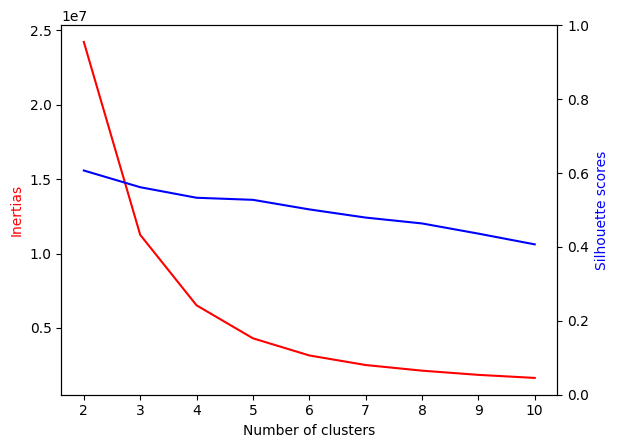

In [270]:
from matplotlib import pyplot as plt
##plot of the inertia and silhouette score

fig, ax1 = plt.subplots()

color = "red"
ax1.set_xlabel("Number of clusters")
ax1.set_ylabel("Inertias", color = color)
ax1.plot(k_range, inertias_km, color = color)
ax2 = ax1.twinx() ##istantiate another axis ax2 that share the same axis of ax1

color = "blue"
ax2.set_ylabel("Silhouette scores", color = color)
ax2.plot(k_range, silhouette_scores_km, color = color)
ax2.set_ylim(0,1) ##set the range of this index

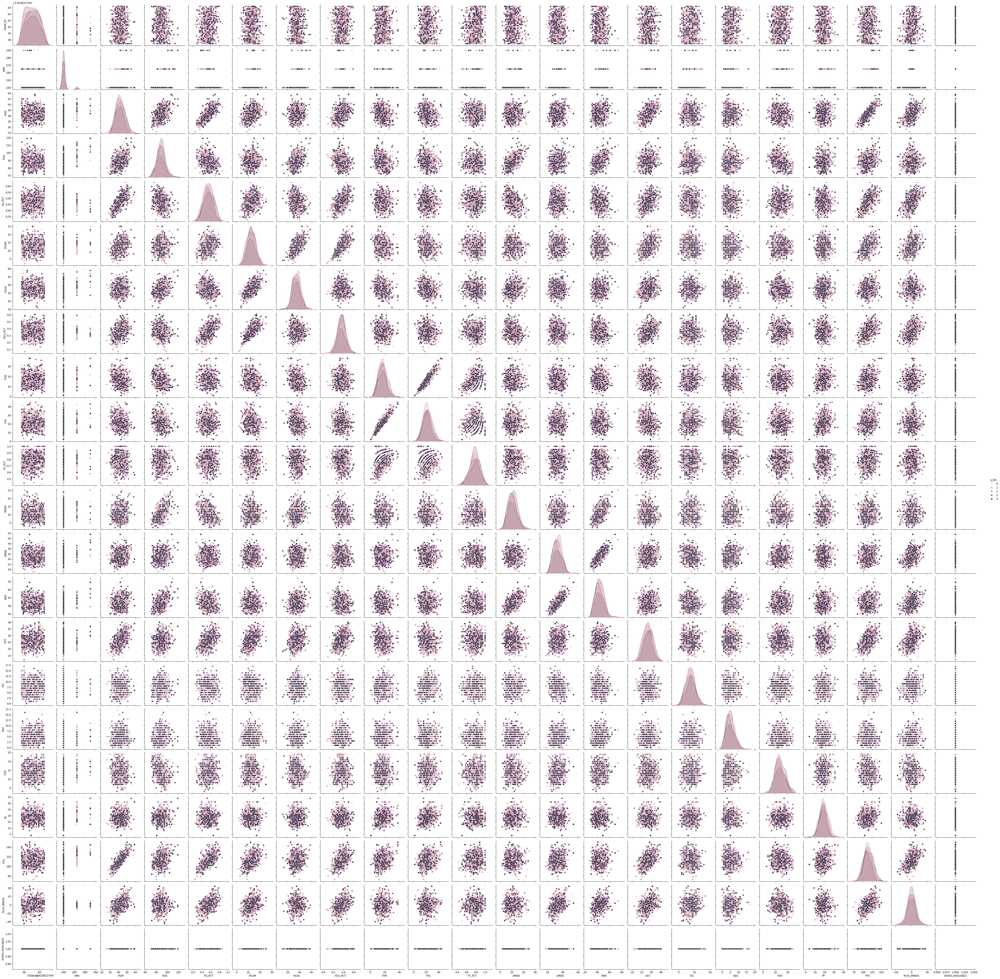

In [272]:
import seaborn as sns
##istantiate the best kmeans clustering scheme
km = KMeans(n_clusters=5, init='k-means++', n_init='auto', random_state=random_state)

##compute cluster centers and predict cluster index for each sample
y_km = km.fit_predict(X)

##add a columns y_km to dataframe
incorrect_df_copy = incorrect_df_copy.dropna()
incorrect_df_copy["y_km"] = y_km

##show the pairplot of the data using as hue y_km
sns.pairplot(incorrect_df_copy, hue = "y_km")

In [273]:
cluster_groups = incorrect_df_copy.groupby('y_km')
 
for key, group in cluster_groups:
    print('\nCluster {:d}: {:d} observations'.format(key, len(group)))
    print(group.head(5))


Cluster 0: 150 observations
    SEASON_ID     TEAM_ID TEAM_ABBREVIATION               TEAM_NAME  \
178     22023  1610612758               SAC        Sacramento Kings   
179     22023  1610612743               DEN          Denver Nuggets   
200     22023  1610612750               MIN  Minnesota Timberwolves   
201     22023  1610612740               NOP    New Orleans Pelicans   
202     22023  1610612739               CLE     Cleveland Cavaliers   

        GAME_ID   GAME_DATE      MATCHUP WL  MIN FGM  ... REB AST STL BLK TOV  \
178  0022300290  2023-12-02  SAC vs. DEN  W  240  48  ...  47  33   7   5  11   
179  0022300290  2023-12-02    DEN @ SAC  L  240  49  ...  46  35   9   7  11   
200  0022300301  2023-12-11    MIN @ NOP  L  240  40  ...  47  26   5   3  14   
201  0022300301  2023-12-11  NOP vs. MIN  W  240  40  ...  47  27   7   7  14   
202  0022300294  2023-12-11    CLE @ ORL  L  240  30  ...  48  15  10   3  14   

     PF  PTS PLUS_MINUS VIDEO_AVAILABLE y_km  
178  14  1

In [276]:
cluster_groups.get_group(0).columns

Index(['SEASON_ID', 'TEAM_ID', 'TEAM_ABBREVIATION', 'TEAM_NAME', 'GAME_ID',
       'GAME_DATE', 'MATCHUP', 'WL', 'MIN', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS', 'VIDEO_AVAILABLE',
       'y_km'],
      dtype='object')

In [280]:
cluster_groups.get_group(0)[['MATCHUP','WL', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS']]

,MATCHUP,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,...,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS
178,SAC vs. DEN,W,48,99,0.485,16,34,0.471,11,15,...,9,38,47,33,7,5,11,14,123,6
179,DEN @ SAC,L,49,99,0.495,6,25,0.24,13,20,...,8,38,46,35,9,7,11,14,117,-6
200,MIN @ NOP,L,40,91,0.44,13,36,0.361,14,19,...,11,36,47,26,5,3,14,28,107,-14
201,NOP vs. MIN,W,40,82,0.488,10,27,0.37,31,40,...,10,37,47,27,7,7,14,20,121,14
202,CLE @ ORL,L,30,85,0.353,9,40,0.225,25,33,...,18,30,48,15,10,3,14,23,94,-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343,BOS @ MIL,L,34,91,0.374,9,35,0.257,25,30,...,6,25,31,22,5,5,6,13,102,-33
344,ORL @ MIA,L,36,82,0.439,12,40,0.3,12,20,...,10,28,38,26,10,8,13,20,96,-3
345,PHI vs. SAC,W,40,93,0.43,15,35,0.429,17,18,...,14,32,46,23,11,9,14,19,112,19
346,SAC @ PHI,L,32,95,0.337,8,38,0.211,21,26,...,23,31,54,20,6,4,17,18,93,-19


In [281]:
cluster_groups.get_group(1)[['MATCHUP','WL', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS']]

,MATCHUP,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,...,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS
504,MIL vs. DEN,W,42,84,0.5,16,34,0.471,12,18,...,9,42,51,30,8,6,13,19,112,17
505,DEN @ MIL,L,36,94,0.383,11,40,0.275,12,17,...,12,36,48,24,7,2,13,14,95,-17
508,MIA @ MIL,W,45,87,0.517,19,40,0.475,14,18,...,7,40,47,34,10,3,14,13,123,26
509,MIL vs. MIA,L,37,83,0.446,13,39,0.333,10,11,...,5,33,38,24,8,4,18,12,97,-26
510,SAC @ DEN,W,39,89,0.438,9,33,0.273,15,19,...,10,38,48,21,7,5,15,18,102,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,DEN @ DAL,L,37,84,0.44,12,28,0.429,19,22,...,6,31,37,26,7,6,8,16,105,-2
668,SAS vs. BKN,W,46,99,0.465,9,37,0.243,21,23,...,13,37,50,30,6,10,18,17,122,7
669,BKN @ SAS,L,47,102,0.461,8,31,0.258,13,19,...,11,37,48,29,13,5,12,20,115,-7
670,ATL @ LAC,W,41,84,0.488,17,34,0.5,11,12,...,10,35,45,32,10,7,16,22,110,17


In [282]:
cluster_groups.get_group(2)[['MATCHUP','WL', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS']]

,MATCHUP,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,...,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS
0,MIN @ TOR,L,34,100,0.34,8,31,0.258,18,22,...,16,46,62,20,8,9,14,14,94,-3
1,TOR vs. MIN,W,36,90,0.4,14,35,0.4,11,16,...,8,39,47,27,9,11,14,18,97,3
2,CHA vs. ATL,W,43,86,0.5,11,37,0.297,19,26,...,12,39,51,34,5,3,19,21,116,6
3,ATL @ CHA,L,39,93,0.419,5,29,0.172,27,33,...,12,30,42,24,12,1,12,19,110,-6
4,LAL vs. PHX,W,36,84,0.429,5,29,0.172,23,29,...,8,34,42,24,14,7,16,23,100,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,MEM @ DAL,W,44,90,0.489,11,34,0.324,9,11,...,13,39,52,27,8,12,15,23,108,14
174,ORL @ BKN,L,35,88,0.398,9,29,0.31,22,27,...,8,29,37,24,3,5,11,27,101,-28
175,BKN vs. ORL,W,46,91,0.505,14,34,0.412,23,31,...,14,43,57,31,4,8,11,21,129,28
176,CHI vs. NOP,W,48,88,0.545,17,40,0.425,11,15,...,12,29,41,32,6,8,13,21,124,6


In [283]:
cluster_groups.get_group(3)[['MATCHUP','WL', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS']]

,MATCHUP,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,...,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS
348,LAL @ UTA,L,46,92,0.5,13,29,0.448,20,24,...,7,33,40,30,6,8,12,23,125,-7
349,UTA vs. LAL,W,42,93,0.452,12,37,0.324,36,39,...,13,39,52,28,7,5,10,20,132,7
350,NOP @ DAL,W,39,79,0.494,12,30,0.4,28,37,...,14,30,44,29,7,4,11,20,118,10
351,DAL vs. NOP,L,37,82,0.451,15,41,0.366,19,20,...,9,25,34,23,6,1,12,25,108,-10
352,WAS @ ATL,W,47,97,0.485,12,32,0.375,21,26,...,12,42,54,32,10,9,12,22,127,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503,SAS @ TOR,W,46,87,0.529,11,30,0.367,19,23,...,5,41,46,37,12,13,19,14,122,23
506,HOU vs. NYK,W,36,80,0.45,10,26,0.385,23,33,...,12,27,39,22,12,3,12,16,105,2
507,NYK @ HOU,L,42,92,0.457,12,36,0.333,7,12,...,19,32,51,19,4,4,17,23,103,-2
736,GSW vs. DAL,W,41,90,0.456,15,32,0.469,7,7,...,11,41,52,29,9,4,17,18,104,4


In [284]:
cluster_groups.get_group(4)[['MATCHUP','WL', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS']]

,MATCHUP,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,...,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS
180,IND vs. BOS,W,43,94,0.457,19,40,0.475,17,21,...,7,34,41,28,8,4,6,15,122,10
181,BOS @ IND,L,46,97,0.474,12,41,0.293,8,12,...,13,43,56,27,5,9,18,19,112,-10
182,PHX @ LAL,L,37,75,0.493,12,25,0.48,17,21,...,8,36,44,25,8,5,22,21,103,-3
183,LAL vs. PHX,W,38,102,0.373,9,30,0.3,21,25,...,21,24,45,24,11,2,10,19,106,3
184,DEN @ LAC,L,41,98,0.418,12,31,0.387,8,9,...,14,32,46,29,7,5,11,20,102,-9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779,CHA @ ATL,W,40,79,0.506,14,36,0.389,21,22,...,5,28,33,25,11,2,14,18,115,1
780,HOU @ UTA,L,40,95,0.421,21,47,0.447,20,22,...,16,23,39,22,8,6,10,18,121,-3
781,UTA vs. HOU,W,44,87,0.506,14,39,0.359,22,27,...,15,34,49,27,8,7,16,20,124,3
782,BOS vs. NYK,L,40,86,0.465,16,42,0.381,13,16,...,10,26,36,25,7,12,12,16,109,-9


In [49]:
from datetime import datetime, timedelta

# Ottieni la data corrente
oggi = datetime.now()

# Calcola la data due mesi fa
due_mesi_fa = oggi - timedelta(days=2 * 30)  # Supponendo che un mese abbia 30 giorni

# Formatta la data nel formato desiderato, ad esempio 'yyyy-mm-dd'
data_due_mesi_fa_formattata = due_mesi_fa.strftime('%Y-%m-%d')

# Stampare la data due mesi fa
print("Data due mesi fa:", data_due_mesi_fa_formattata)


Data due mesi fa: 2024-02-16
